# Ex16. 난 스케치를 할 테니 너는 채색을 하거라

In [5]:
import tensorflow_datasets as tfds
import tensorflow as tf
from tensorflow.keras import layers, Input, Model
from tensorflow.keras import optimizers, losses
from tensorflow import data
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import time
import imageio
# import PIL
from IPython import display

### 학습용 데이터와 테스트용 데이터 수

In [6]:
data_dir =os.getenv('HOME')+'/aiffel/conditional_generation'
train_path = os.getenv('HOME')+'/aiffel/conditional_generation/data_2/cityscapes/train/'
print("number of train examples :", len(os.listdir(train_path)))
test_path = os.getenv('HOME')+'/aiffel/conditional_generation/data_2/cityscapes/val/'
print("number of test examples :", len(os.listdir(test_path)))

number of train examples : 1000
number of test examples : 5


### 학습용 데이터셋에서 임의로 6장 로딩

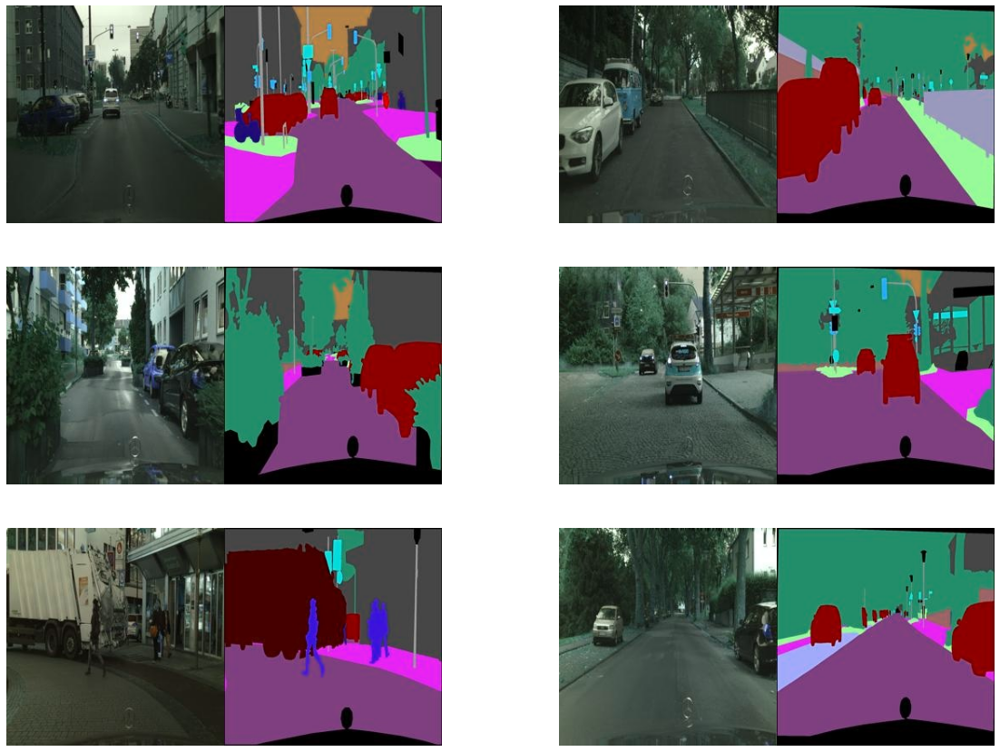

In [8]:
plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_path + os.listdir(train_path)[np.random.randint(800)]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.axis('off')
    plt.imshow(img)

In [9]:
f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


### 이미지 사이즈 조절 함수와 이미지 로드 함수 등등 

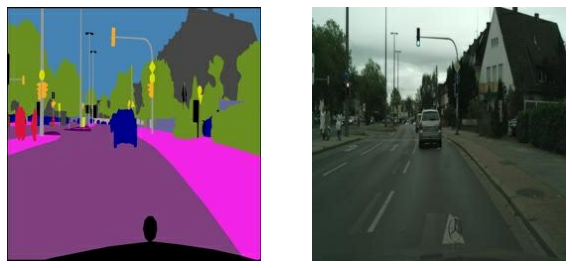

In [10]:
def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1    #  [-1,1] 사이의 값으로...

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)  # 다시 원래 [0,255] 사이의 값으로...

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2
    colored = img[:, :w, :] 
    colored = tf.cast(colored, tf.float32)
    sketch = img[:, w:, :] 
    sketch = tf.cast(sketch, tf.float32)
    return normalize(sketch), normalize(colored)

f = train_path + os.listdir(train_path)[1]
input_image, real_image = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(denormalize(input_image))
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(denormalize(real_image))

### 이미지에 대한 연산들 (반사, 플립, 회전)

In [13]:
@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,3:], out[...,:3]   

print("✅")

✅


### Augmentation의 적용 예

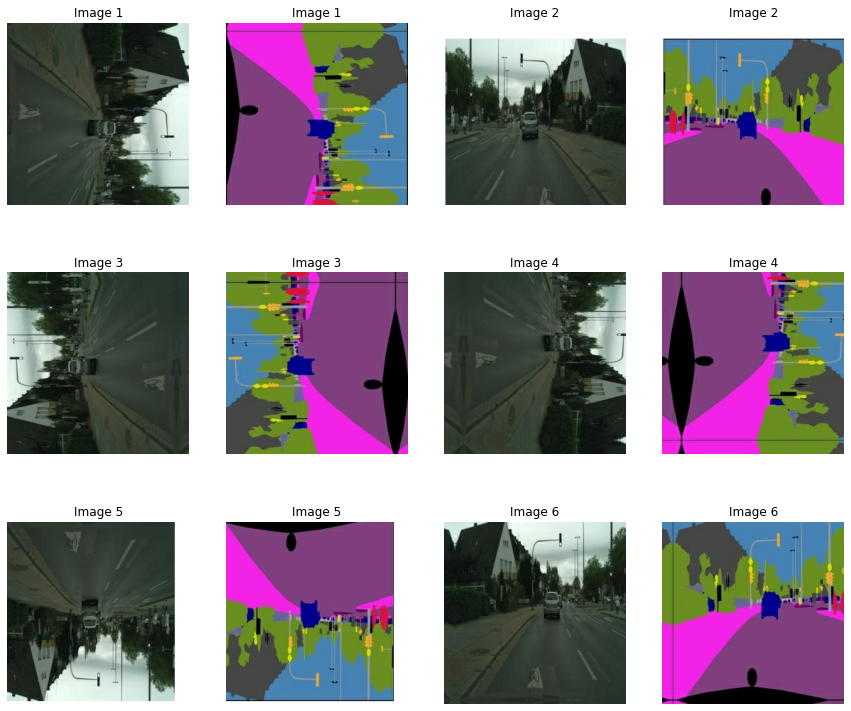

In [14]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(input_image, real_image)
    
    plt.subplot(3,4,i); plt.axis('off')
    plt.imshow(denormalize(augmented_sketch)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); plt.axis('off')
    plt.imshow(denormalize(augmented_colored)); plt.title(f"Image {img_n}")
    img_n += 1

### 스케치 이미지와 실제 사진 교환(반전)

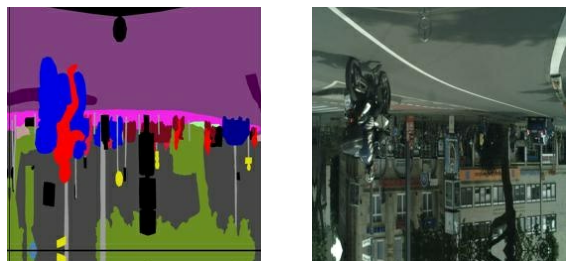

In [15]:
from tensorflow import data

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch,colored)
    return colored, sketch

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4) #매핑함수를 이용하여 스케치 이미지로 사상

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.axis('off'); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.axis('off'); plt.imshow(colored[0].astype(np.uint8))

### 엔코드 블록 클래스와 디코드 블록 클래스 선언

In [16]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    
print("✅")

✅


### UNet 제너레이터 만들기

In [17]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]                   #대칭적인 형태임을 알 수 있다.
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [18]:
generator = UNetGenerator()
generator.get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

In [19]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


In [20]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 32)]    0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 130, 130, 32)      0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 127, 127, 64)      32768     
_________________________________________________________________
batch_normalization_15 (Batc (None, 127, 127, 64)      256       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 127, 127, 64)      0         
Total params: 33,024
Trainable params: 32,896
Non-trainable params: 128
_________________________________________________________________


### 디스크리미네이터 만들기

In [21]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


In [22]:
discriminator = Discriminator()
discriminator.get_summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_3[0][0]                    
                                                                 input_4[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

### 랜덤 이미지 테스트

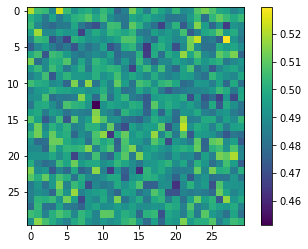

In [23]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

### 제너레이터와 디스크리미네이터의 losses 정의

In [24]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


In [25]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

print("✅")

✅


### 훈련 스텝 정의 (그래디언트와 로스 계산 등)

In [26]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


### 훈련용 이미지 생성 및 훈련되는 이미지 저장

In [27]:
def generate_and_save_images(model, epoch, it, save_file_num=1):

    plt.figure(figsize=(15,15))
    for train_idx in range(len(os.listdir(train_path))//10):
        f = train_path + os.listdir(train_path)[train_idx]
        input_image, real_image = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0)) 
        pred = denormalize(pred)

        plt.subplot(10, 10, train_idx+1)  # 100개 sample 이라서 10행 10열로 시각화
        plt.imshow(pred[0])
        plt.axis('off')

    plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)

    data_dir =os.getenv('HOME')+'/aiffel/conditional_generation'
    save_file_path = os.path.join(data_dir, 'generated_samples/sample_{}'.format(save_file_num))
    if not os.path.exists(save_file_path):
        os.makedirs(save_file_path)
    
    save_file_path = os.path.join(save_file_path, 'sample_epoch_{:04d}_iter_{:03d}.png'.format(epoch, it))
    plt.savefig(save_file_path)  # 이미지 저장

    plt.show()

### 훈련 히스토리로 그래프 그리며 관측하기

In [28]:
def draw_train_history(history, epoch, save_file_num=1):
    plt.figure(figsize=(15,15))

    plt.subplot(411)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')

    plt.subplot(412)  
    plt.plot(history['gen_loss'], 'tab:blue')   
    plt.title('gen_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss'], loc='upper left')

    plt.subplot(413)  
    plt.plot(history['l1_loss'], 'tab:green')   
    plt.title('l1_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['l1_loss'], loc='upper left')  

    plt.subplot(414)  
    plt.plot(history['disc_loss'], 'tab:orange')   
    plt.title('disc_loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['disc_loss'], loc='upper left')  

    plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)

    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    data_dir =os.getenv('HOME')+'/aiffel/conditional_generation'
    save_file_path = os.path.join(data_dir, 'training_history/training_history_{}'.format(save_file_num))
    if not os.path.exists(save_file_path):
        os.makedirs(save_file_path)
    
    save_file_path = os.path.join(save_file_path, 'training_history_{:04d}.png'.format(epoch))
    plt.savefig(save_file_path)  # 이미지 저장

    plt.show()

In [29]:
checkpoint = tf.train.Checkpoint(generator_optimizer=gene_opt,
                                 discriminator_optimizer=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

## 50에폭 훈련 결과

In [30]:
def train(dataset, epochs, save_every, save_file_num=1):
    start = time.time()
    history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}
    data_dir =os.getenv('HOME')+'/aiffel/conditional_generation'
    
    for epoch in range(1, epochs+1):
        epoch_start = time.time()
        for i, (input_image, ground_truth) in enumerate(train_images):
            g_loss, l1_loss, d_loss = train_step(input_image, ground_truth)
            history['gen_loss'].append(g_loss)
            history['l1_loss'].append(l1_loss)
            history['disc_loss'].append(d_loss)
                    
            # 100회 반복마다 손실을 출력합니다.
            if (i+1) % 100 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, i+1, save_file_num)
                print(f"EPOCH[{epoch+1}] - STEP[{i+1}] \
                        \nTime for epoch {epoch} : {int(time.time()-epoch_start)} sec \
                        \nGenerator_loss:{g_loss.numpy():.4f} \
                        \nL1_loss:{l1_loss.numpy():.4f} \
                        \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")
                
        if (epoch + 1) % save_every == 0:
            checkpoint_dir = os.path.join(data_dir, 'training_checkpoints/training_checkpoints_{}'.format(save_file_num))
            checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, i, save_file_num)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch, save_file_num)

In [31]:
save_every = 5  # 모델 저장 간격
EPOCHS = 50  # 학습 횟수
save_file_num = 1

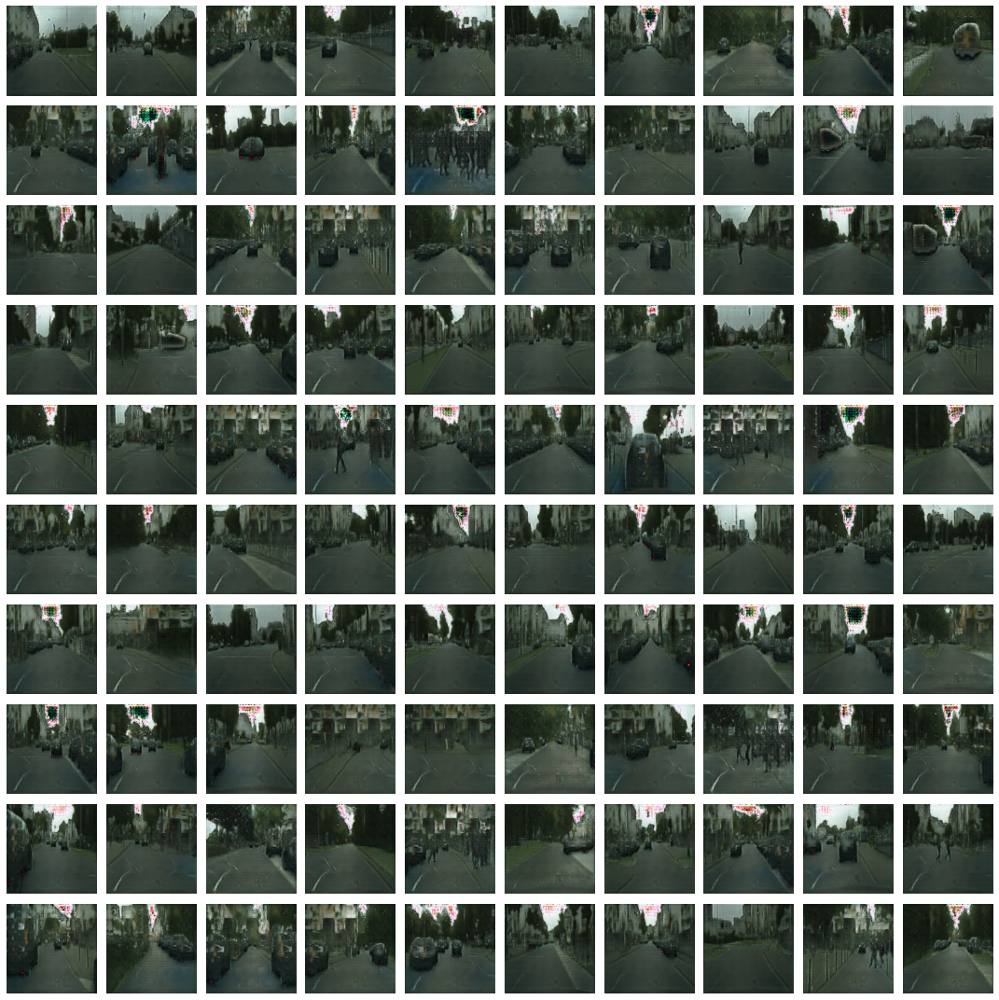

Time for training : 3850 sec


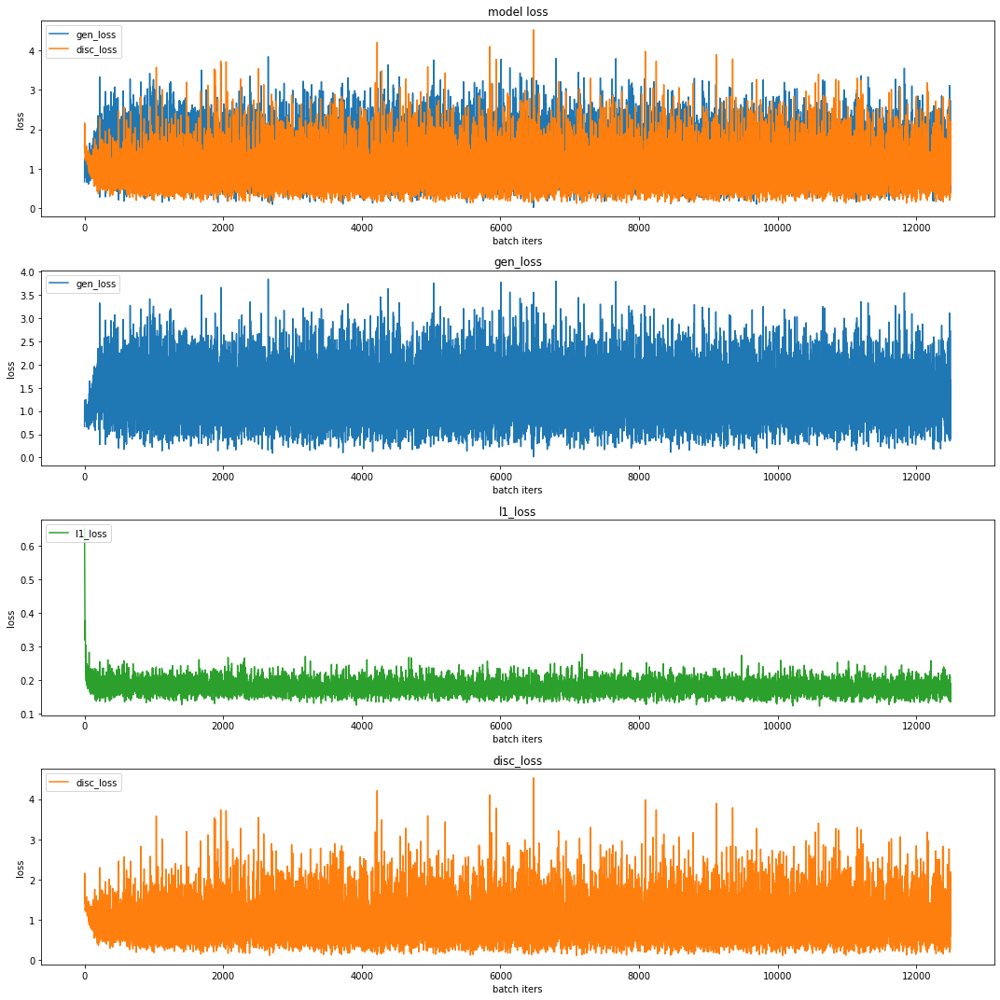

CPU times: user 1h 4min 30s, sys: 1min 32s, total: 1h 6min 2s
Wall time: 1h 4min 12s


In [33]:
%%time
train(train_images, EPOCHS, save_every, save_file_num)

* gif 이미지 만들기

In [34]:
def make_a_gif(anim_file_num=1, flag=True):
    if flag:
        anim_file = (os.getenv('HOME')+'/aiffel/conditional_generation/gif/Pix2Pix_{}.gif').format(anim_file_num)
        filenames = glob.glob(os.getenv('HOME')+'/aiffel/conditional_generation/generated_samples/sample_{}/sample*.png'.format(anim_file_num)) # Fake Images
    else:
        anim_file = (os.getenv('HOME')+'/aiffel/conditional_generation/gif/Pix2Pix_history_{}.gif').format(anim_file_num)
        filenames = glob.glob(os.getenv('HOME')+'/aiffel/conditional_generation/training_history/training_history_{}/training_history*.png'.format(anim_file_num)) # Graphs

    with imageio.get_writer(anim_file, mode='I') as writer:
        filenames = sorted(filenames)
        last = -1
        for i, filename in enumerate(filenames):
            frame = 2*(i**0.5)
            if round(frame) > round(last):
                last = frame
            else:
                continue
            image = imageio.imread(filename)
            writer.append_data(image)
        image = imageio.imread(filename)
        writer.append_data(image)

In [35]:
# Fake Images to GIF
make_a_gif(1, True)

In [36]:
# History Graphs to GIF
make_a_gif(1, False)

In [37]:
#체크포인트 불러와서 결과 확인
def draw_training_checkpoints_image(save_file_num=1):
    checkpoint_dir = os.path.join(data_dir, '/training_checkpoints/training_checkpoints_{}'.format(save_file_num))
    latest = tf.train.latest_checkpoint(checkpoint_dir)
    checkpoint.restore(latest)

    generator = checkpoint.generator
    discriminator = checkpoint.discriminator

    # 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
    for test_idx in range(len(os.listdir(test_path))):
        f = test_path + os.listdir(test_path)[test_idx]
        input_image, real_image = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0))
        pred = denormalize(pred)

        plt.figure(figsize=(20,10))
        
        plt.subplot(1,3,1); plt.axis('off'); plt.imshow(denormalize(input_image)); plt.title('Input Image')
        plt.subplot(1,3,2); plt.axis('off'); plt.imshow(pred[0]); plt.title('Predicted Image', fontsize=20)
        plt.subplot(1,3,3); plt.axis('off'); plt.imshow(denormalize(real_image)); plt.title('Ground Truth')

        plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)
        plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 cityscapes 이미지가 그려질 것입니다.

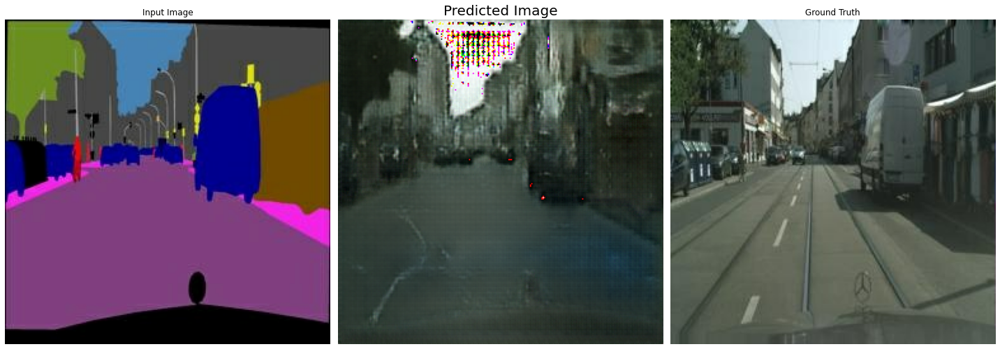

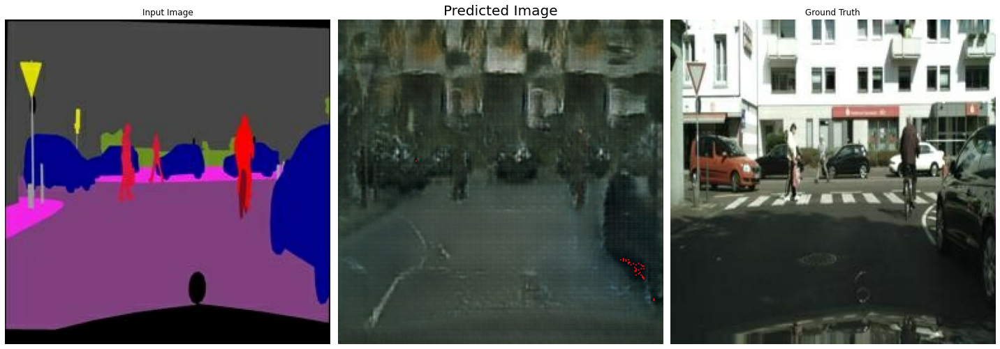

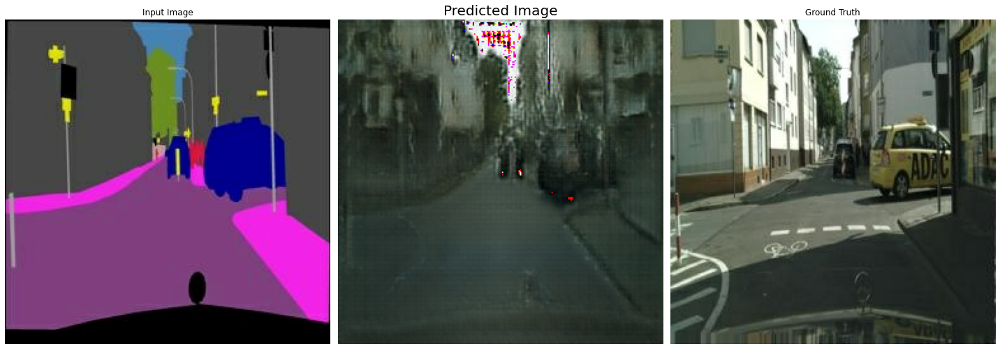

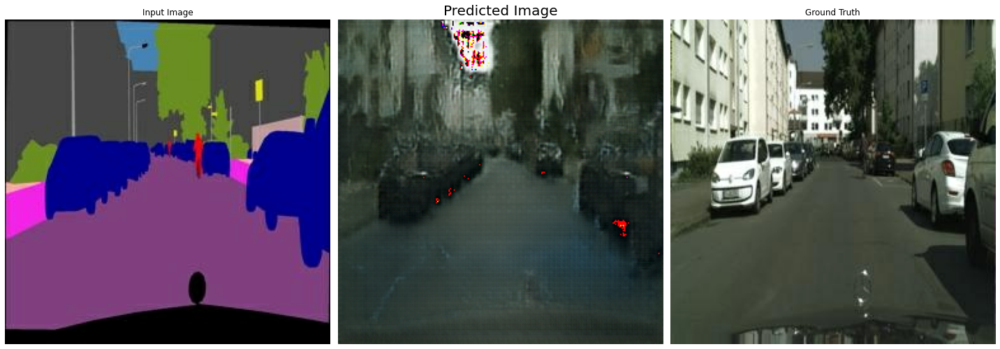

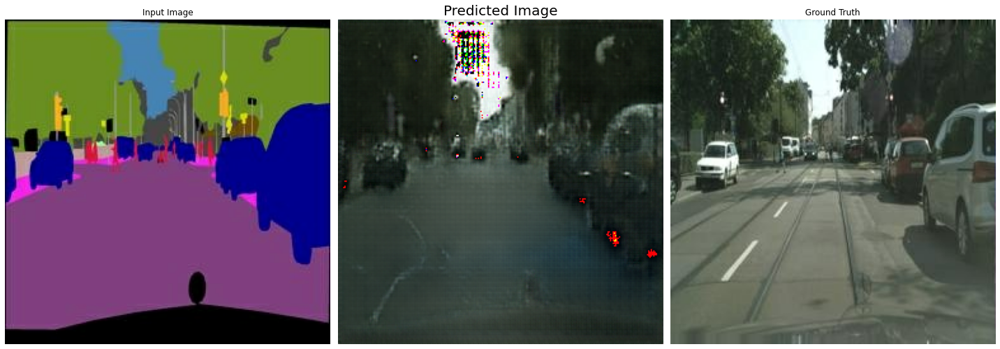

In [38]:
draw_training_checkpoints_image(1)

## 결과 (Overall Results)

### 1. 10x10 훈련 이미지 훈련 결과
* 마지막 훈련 스텝 10x10 이미지

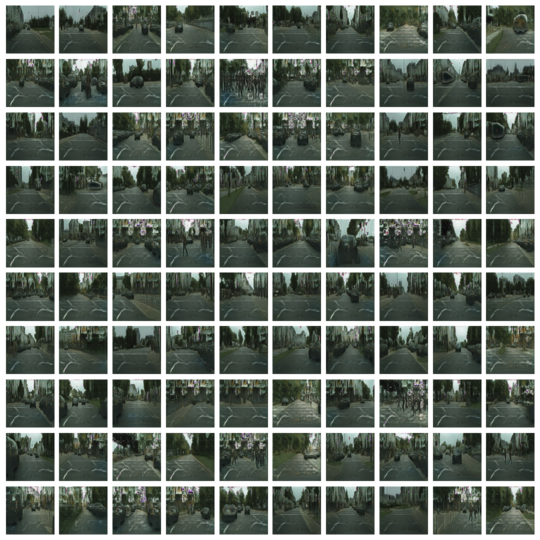

* 전체 훈련 스텝(50 EPOCHS) 10x10 GIF 이미지

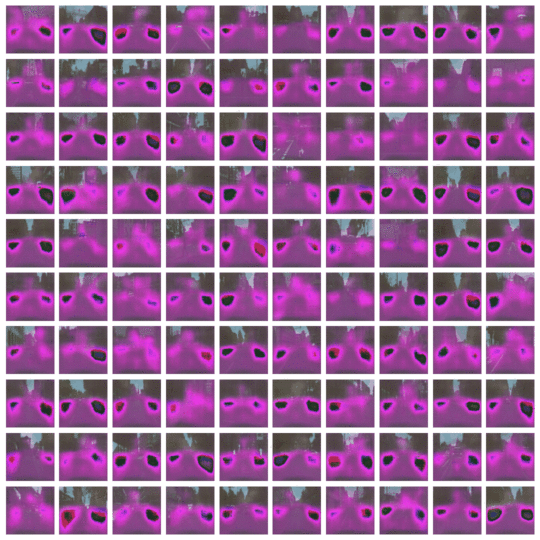

* 훈련 스텝 Losses 그래프

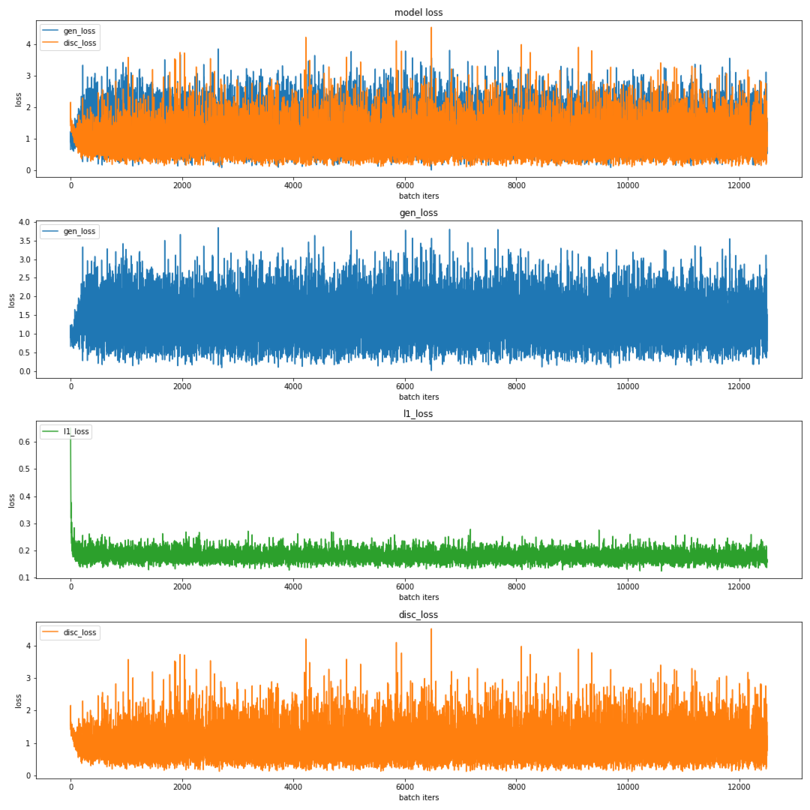

* 전체 훈련 스텝 Losses 그래프 GIF 이미지

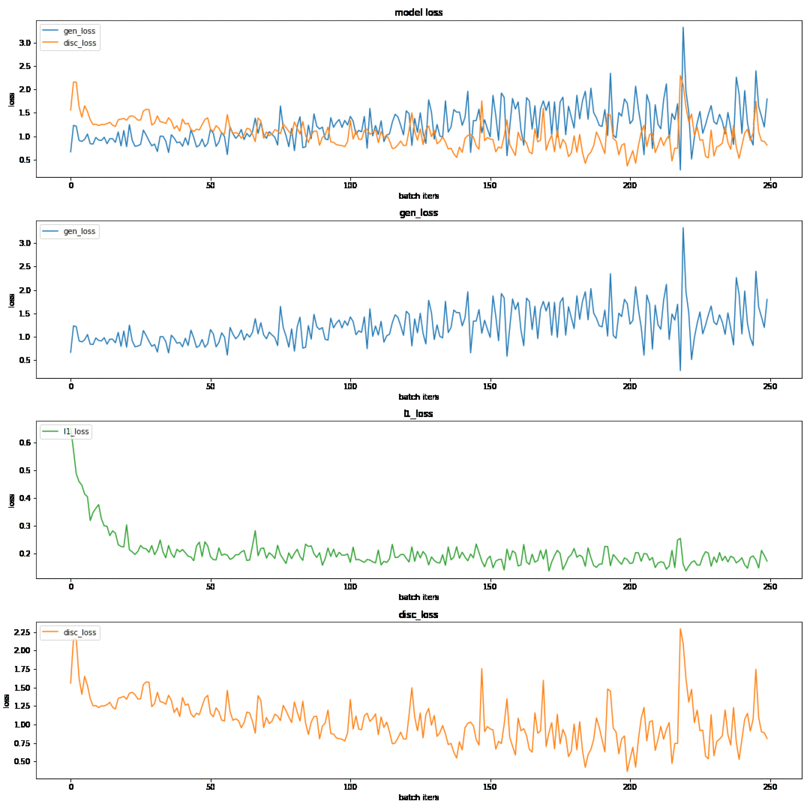

### 2. 테스트 이미지 5장 테스트 결과

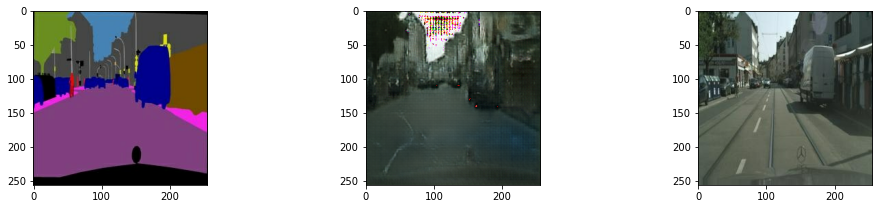

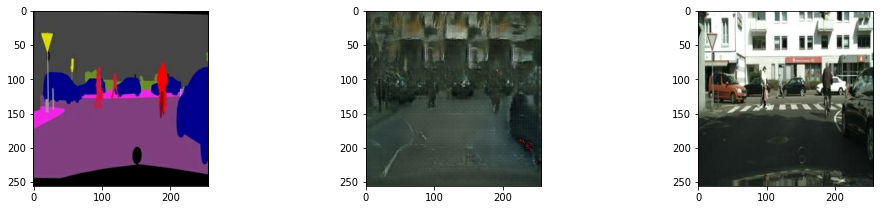

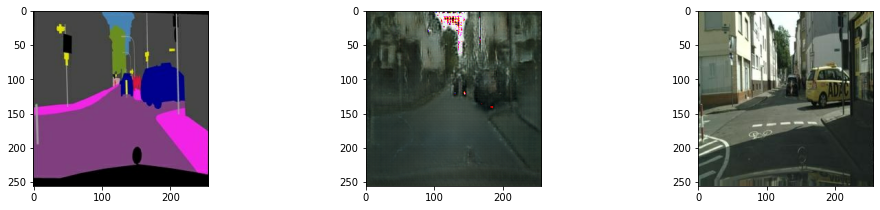

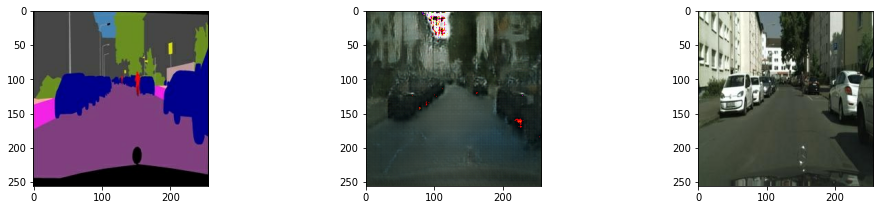

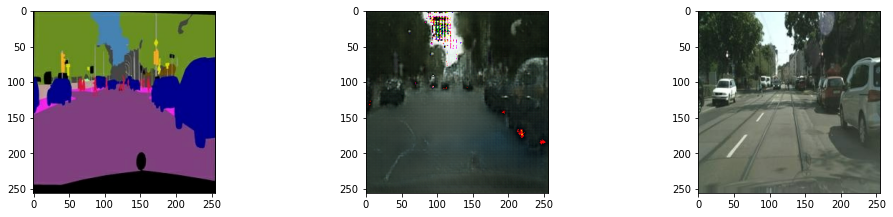

In [62]:
for i in range(1,15,3):

    f = test_path + os.listdir(test_path)[i//3]
    sketch, colored = load_img(f)

    pred = generator(tf.expand_dims(sketch, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(14,14))
    plt.subplot(5,3,i); plt.imshow(denormalize(sketch))
    plt.subplot(5,3,i+1); plt.imshow(pred[0])
    plt.subplot(5,3,i+2); plt.imshow(denormalize(colored))
    plt.tight_layout()  # subplot 간격 자동 조절(겹치지 않게)
    plt.show() 

비교적 거리 같다는 느낌은 받을 수 있었다.

<회고>

* GAN의 발전된 형태인 cGAN에 대해서 이해할 수 있어 기뻤다.  
* 속이는 Generator와 속이는 것을 판단하는 Discriminator사이의 관계를 수식으로 알 수 있어 뜻깊었다.   
  
  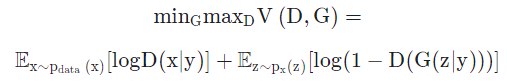  
  
  진짜 이미지를 1 제너레이터가 만드는 가짜 이미지를 0이라고 할 때,  
  제너레이터의 입력 z는 y를 가이드로 하여 로그 안의 값을 최소화하려 하므로 자신이 만든 가짜를     
  진짜같이 만들어야 하는 원리가 있다. 반면 디스크리미네이터의 입력 x는 두개의 로그를 최대화하여야      
  하므로 진짜를 진짜같이 가짜를 가짜같이 구별해내야 한다.  
  y는 어떤 정보여도 좋으나 내가 생각하기엔 label만의 정보를 가진 스케치 이미지를 조건으로 하는 것    
  아닌가 생각된다. (=segmentation Images)   
  즉 제너레이터는 real image를 한 손에 들고 다른 손으로 스케치를 한 뒤 가짜 image를 만들고    
  디스크리미네이터는 real image로 가짜 image를 판별하는 것 같은 상황이다.    
* Input image와 real image를 바탕으로 제너레이터가 생성하는 predicted image를 디스크리미네이터가 얼마나  
  잘 구별하나가 관건인데 디스크리미네이터의 로스(마지막 오렌지색 그래프)의 최소치가 거의 일정한   
  걸로 봐서 제너레이터가 만드는 그림이 아직 완성도가 좋지는 않다는 것을 알 수 있다.    
* 평균적으로 gen_loss가 disc_loss보다 높은데 이것은 역시 제너레이터 입장에서는    
  디스크리미네이터를 잘 속이지 못하고 있다는 것이고   
  따라서 디스크리미네이터 입장에서는 로스가 적으므로 제너레이터가 생성하는 가짜 이미지를 잘  
  분별하고 있다는 설명이 된다.  
  